#Installation of Packages

In [1]:
# Commands to install some of the libraries in-case if they are not installed
# Any other library that needs to be installed just use: !pip install <library name>
!pip install seaborn
!pip install missingno
!pip install xgboost
!pip install catboost
!pip install regex
!pip install sklearn
!pip install pandas
!pip install numpy
!pip install imblearn
!pip install lightgbm

     |████████████████████████████████| 76.6 MB 1.3 MB/s 


In [2]:
import pandas as pd   # data processing, CSV file I/O (e.g. pd.read_csv)
import numpy as np   # linear algebra

In [3]:
import matplotlib.pyplot as plt  #graphs and plots
import seaborn as sns   #data visualizations 
import csv # Some extra functionalities for csv  files - reading it as a dictionary
from lightgbm import LGBMClassifier #sklearn is for machine learning and statistical modeling including classification, regression, clustering and dimensionality reduction 

from sklearn.model_selection import train_test_split, cross_validate   #break up dataset into train and test sets

In [4]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler, MinMaxScaler


# importing python library for working with missing data
import missingno as msno
# To install missingno use: !pip install missingno
import re    # This library is used to perform regex pattern matching

# import various functions from sklearn
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC
from sklearn.ensemble import GradientBoostingClassifier
from catboost import CatBoostClassifier
import xgboost as xgb
from sklearn.metrics import roc_auc_score, accuracy_score, precision_score, recall_score, classification_report, make_scorer
from sklearn.linear_model import SGDClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split

In [5]:
from sklearn.model_selection import KFold,cross_val_score, RepeatedStratifiedKFold,StratifiedKFold
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.preprocessing import OneHotEncoder,StandardScaler,PowerTransformer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import KNNImputer,SimpleImputer
from sklearn.compose import make_column_transformer
from imblearn.pipeline import make_pipeline
from sklearn.svm import SVC
from sklearn.impute import SimpleImputer
from sklearn.dummy import DummyClassifier
from imblearn.over_sampling import SMOTE
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score, balanced_accuracy_score,\
                            precision_score, recall_score, roc_auc_score,\
                            plot_confusion_matrix, classification_report, plot_roc_curve, f1_score

import plotly 
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from plotly.offline import iplot
from plotly.subplots import make_subplots
import plotly.figure_factory as ff

import warnings
warnings.filterwarnings("ignore")

#upload the csv and declare its name to = the csv
#In this project we are naming our dataset diabetes

In [6]:
diabetes = pd.read_csv('/content/Diabetes_Dataset (Clean).csv')

In [7]:
diabetes.head()

,race,gender,age,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,...,tolazamide,insulin,glyburide-metformin,glipizide-metformin,glimepiride-pioglitazone,metformin-rosiglitazone,metformin-pioglitazone,change,diabetesMed,readmitted
0,Caucasian,1,[0-10),6,25,1,1,41,0,1,...,0 mg,0 mg,0 mg,0 mg,0 mg,0 mg,0 mg,0,0,0
1,Caucasian,1,[11-21),1,1,7,3,59,0,18,...,0 mg,131 - 180 mg,0 mg,0 mg,0 mg,0 mg,0 mg,1,1,0
2,AfricanAmerican,1,[22-31),1,1,7,2,11,5,13,...,0 mg,0 mg,0 mg,0 mg,0 mg,0 mg,0 mg,0,1,0
3,Caucasian,2,[32-41),1,1,7,2,44,1,16,...,0 mg,131 - 180 mg,0 mg,0 mg,0 mg,0 mg,0 mg,1,1,0
4,Caucasian,2,[42-51),1,1,7,1,51,0,8,...,0 mg,< 100 mg,0 mg,0 mg,0 mg,0 mg,0 mg,1,1,0


In [8]:
y = diabetes['readmitted']

In [9]:
print(f'Percentage of patient have had readmitted: % {round(y.value_counts(normalize=True)[1]*100,2)} --> ({y.value_counts()[1]} patient)\nPercentage of patient have not been readmitted: % {round(y.value_counts(normalize=True)[0]*100,2)} --> ({y.value_counts()[0]} patient)')

Percentage of patient have had readmitted: % 11.16 --> (11357 patient)
Percentage of patient have not been readmitted: % 88.84 --> (90409 patient)


In [10]:
 diabetes.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 101766 entries, 0 to 101765
Data columns (total 39 columns):
 #   Column                    Non-Null Count   Dtype 
---  ------                    --------------   ----- 
 0   race                      101766 non-null  object
 1   gender                    101766 non-null  int64 
 2   age                       101766 non-null  object
 3   admission_type_id         101766 non-null  int64 
 4   discharge_disposition_id  101766 non-null  int64 
 5   admission_source_id       101766 non-null  int64 
 6   time_in_hospital          101766 non-null  int64 
 7   num_lab_procedures        101766 non-null  int64 
 8   num_procedures            101766 non-null  int64 
 9   num_medications           101766 non-null  int64 
 10  number_outpatient         101766 non-null  int64 
 11  number_emergency          101766 non-null  int64 
 12  number_inpatient          101766 non-null  int64 
 13  number_diagnoses          101766 non-null  int64 
 14  max_

In [11]:
def missing (diabetes):
    missing_number = diabetes.isnull().sum().sort_values(ascending=False)
    missing_percent = (diabetes.isnull().sum()/diabetes.isnull().count()).sort_values(ascending=False)
    missing_values = pd.concat([missing_number, missing_percent], axis=1, keys=['Missing_Number', 'Missing_Percent'])
    return missing_values

missing(diabetes)

,Missing_Number,Missing_Percent
race,0,0.0
tolazamide,0,0.0
glipizide,0,0.0
glyburide,0,0.0
pioglitazone,0,0.0
rosiglitazone,0,0.0
acarbose,0,0.0
miglitol,0,0.0
troglitazone,0,0.0
insulin,0,0.0


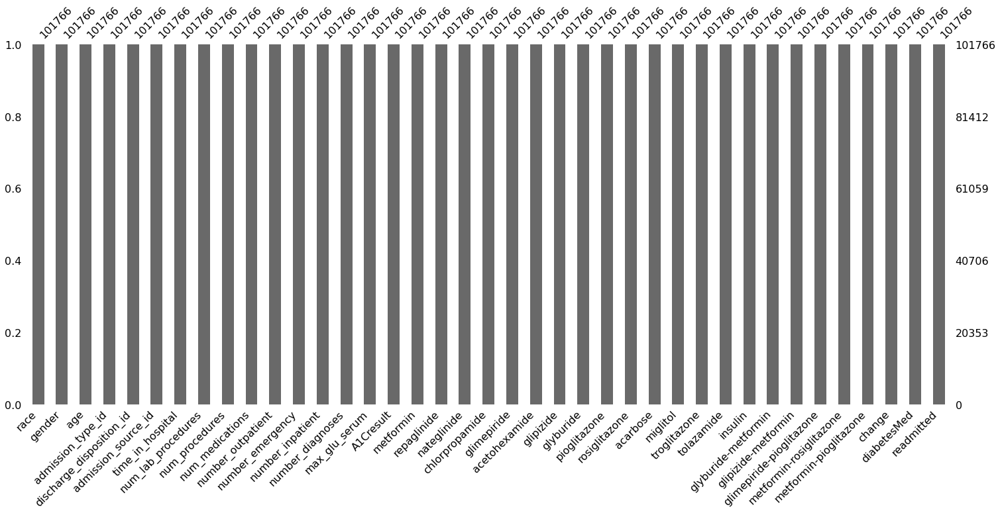

In [12]:
msno.bar(diabetes)

In [13]:
categorical = ['race']

numerical = ['gender','age','admission_type_id','discharge_disposition_id','admission_source_id','time_in_hospital','num_lab_procedures','num_medications','number_outpatient','number_emergency','number_inpatient','number_diagnoses','max_glu_serum','A1Cresult','metformin','repaglinide','nateglinide','chlorpropamide','glimepiride','acetohexamide','glipizide','glyburide','pioglitazone','rosiglitazone','acarbose','miglitol','troglitazone','tolazamide','insulin','glyburide-metformin','glipizide-metformin','glimepiride-pioglitazone','metformin-pioglitazone','change','diabetesMed','readmitted']

In [14]:
diabetes[numerical].describe()

,gender,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,change,diabetesMed,readmitted
count,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000,101766.000000
mean,1.462355,2.024006,3.715642,5.754437,4.395987,43.095641,16.021844,0.369357,0.197836,0.635566,7.422607,0.461952,0.770031,0.111599
std,0.498642,1.445403,5.280166,4.064081,2.985108,19.674362,8.127566,1.267265,0.930472,1.262863,1.933600,0.498553,0.420815,0.314874
min,0.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,1.000000,1.000000,2.000000,31.000000,10.000000,0.000000,0.000000,0.000000,6.000000,0.000000,1.000000,0.000000
50%,1.000000,1.000000,1.000000,7.000000,4.000000,44.000000,15.000000,0.000000,0.000000,0.000000,8.000000,0.000000,1.000000,0.000000
75%,2.000000,3.000000,4.000000,7.000000,6.000000,57.000000,20.000000,0.000000,0.000000,1.000000,9.000000,1.000000,1.000000,0.000000
max,2.000000,8.000000,28.000000,25.000000,14.000000,132.000000,81.000000,42.000000,76.000000,21.000000,16.000000,1.000000,1.000000,1.000000


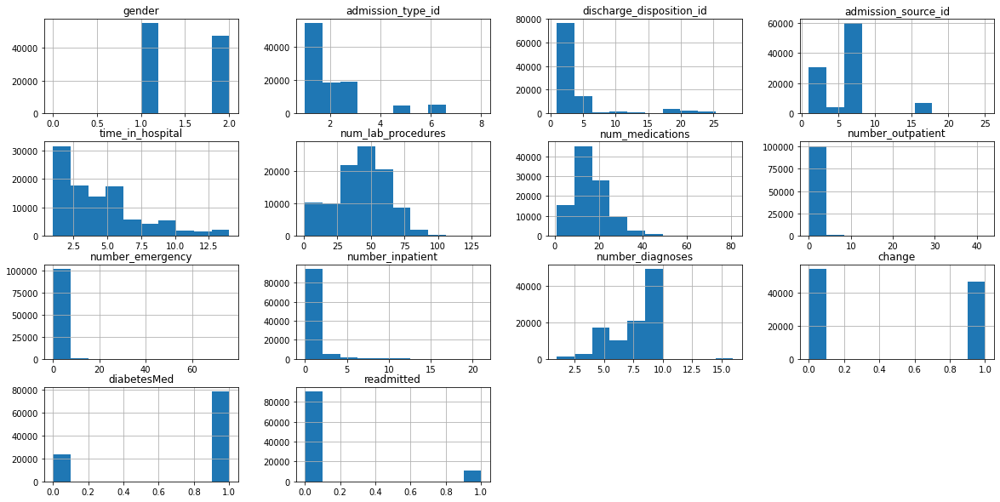

In [15]:
diabetes[numerical].hist(figsize=(20,10));

#Variable Testing

In [16]:
diabetes['A1Cresult'].describe()

count     101766
unique         4
top            0
freq       84748
Name: A1Cresult, dtype: object

In [17]:
print (f'{round(diabetes["A1Cresult"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="A1Cresult", title='A1Cresult', width=500, height=500)
fig.show()

0          83.28
> 5 .7      8.07
1           4.90
< = 5.7     3.75
Name: A1Cresult, dtype: float64


In [18]:
fig = px.scatter(diabetes, x='A1Cresult', y='readmitted', title=' Patients and A1Cresult ',color='readmitted', hover_data = diabetes[['readmitted']])
fig.show()

In [19]:
diabetes['max_glu_serum'].describe()

count     101766
unique         3
top            0
freq       99017
Name: max_glu_serum, dtype: object

In [20]:
diabetes['max_glu_serum'].count()

101766

In [21]:
print (f'{round(diabetes["max_glu_serum"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="max_glu_serum", title='Max Glu Serum', width=500, height=500)
fig.show()

0       97.30
>200     1.46
>300     1.24
Name: max_glu_serum, dtype: float64


In [22]:
fig = px.scatter(diabetes, x='max_glu_serum', y='readmitted', title=' Patients and Maximum Glucose Serum Amounts ',color='readmitted', hover_data = diabetes[['readmitted']])
fig.show()

In [23]:
diabetes.insulin

0                 0 mg
1         131 - 180 mg
2                 0 mg
3         131 - 180 mg
4             < 100 mg
              ...     
101761      100-149 mg
101762        < 100 mg
101763      100-149 mg
101764    131 - 180 mg
101765            0 mg
Name: insulin, Length: 101766, dtype: object

In [24]:
diabetes.insulin.describe()

count     101766
unique         4
top         0 mg
freq       47383
Name: insulin, dtype: object

In [25]:
diabetes['insulin'].count()

101766

In [26]:
print (f'{round(diabetes["insulin"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="insulin", title='insulin', width=500, height=500)
fig.show()

0 mg            46.56
< 100 mg        30.31
100-149 mg      12.01
131 - 180 mg    11.12
Name: insulin, dtype: float64


In [27]:
fig = px.scatter(diabetes, x='insulin', y='readmitted', title='Insulin Amount and readmission ',color='readmitted', hover_data = diabetes[['readmitted']])
fig.show()

In [28]:
diabetes.age

0          [0-10)
1         [11-21)
2         [22-31)
3         [32-41)
4         [42-51)
           ...   
101761    [72-81)
101762    [82-91)
101763    [72-81)
101764    [82-91)
101765    [72-81)
Name: age, Length: 101766, dtype: object

In [29]:
diabetes['age'].describe()

count      101766
unique         10
top       [72-81)
freq        26068
Name: age, dtype: object

In [30]:
diabetes['age'].count()

101766

In [31]:
print (f'{round(diabetes["age"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="age", title='Age', width=500, height=500)
fig.show()

[72-81)     25.62
[62-71)     22.09
[52-61)     16.96
[82-91)     16.90
[42-51)      9.52
[32-41)      3.71
[92-100)     2.74
[22-31)      1.63
[11-21)      0.68
[0-10)       0.16
Name: age, dtype: float64


In [32]:
fig = px.scatter(diabetes, x='age', y='readmitted', title='Age of Patients and readmission ',color='readmitted', hover_data = diabetes[['readmitted']])
fig.show()

In [33]:
print (f'{round(diabetes["gender"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="gender", title='Gender', width=500, height=500)
fig.show()

1    53.76
2    46.24
0     0.00
Name: gender, dtype: float64


In [34]:
print (f'{round(diabetes["diabetesMed"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="diabetesMed", title='diabetesMed', width=500, height=500)
fig.show()

1    77.0
0    23.0
Name: diabetesMed, dtype: float64


In [35]:
print (f'{round(diabetes["number_diagnoses"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="number_diagnoses", title='Number of Diagnoses', width=500, height=500)
fig.show()

9     48.62
5     11.20
8     10.43
7     10.21
6      9.98
4      5.44
3      2.79
2      1.01
1      0.22
16     0.04
10     0.02
13     0.02
11     0.01
15     0.01
12     0.01
14     0.01
Name: number_diagnoses, dtype: float64


In [36]:
print (f'{round(diabetes["number_emergency"].value_counts(normalize=True)*100,2)}')
fig = px.histogram(diabetes, x="number_emergency", title='Number of Emergencies', width=500, height=500)
fig.show()

0     88.81
1      7.54
2      2.01
3      0.71
4      0.37
5      0.19
6      0.09
7      0.07
8      0.05
10     0.03
9      0.03
11     0.02
13     0.01
12     0.01
22     0.01
16     0.00
18     0.00
19     0.00
20     0.00
15     0.00
14     0.00
25     0.00
21     0.00
28     0.00
42     0.00
46     0.00
76     0.00
37     0.00
64     0.00
63     0.00
54     0.00
24     0.00
29     0.00
Name: number_emergency, dtype: float64


# Total amount Readmitted vs. non-readmitted

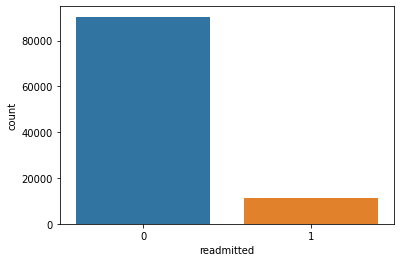

In [37]:
sns.countplot(data=diabetes,x=diabetes["readmitted"])


#Total Breakdown of Gender

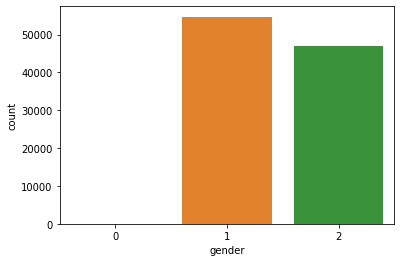

In [38]:
sns.countplot(data=diabetes,x=diabetes["gender"])


# Total number of emergencies

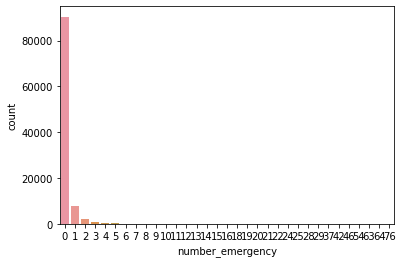

In [39]:
sns.countplot(data=diabetes,x=diabetes["number_emergency"])


#Mutual Info Score

In [40]:
from sklearn.metrics import mutual_info_score
def cat_mut_inf(series):
  return mutual_info_score(series, diabetes['readmitted'])

diabetes_cat = diabetes[categorical].apply(cat_mut_inf)
diabetes_cat = diabetes_cat.sort_values(ascending=False).to_frame(name='mutual_info_score')
diabetes_cat  

,mutual_info_score
race,0.000136


As seen above, most of the categorical variables have almost no effect on the target variable.


#HeatMap

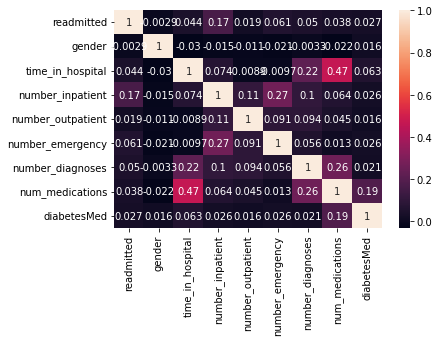

In [41]:
sns.heatmap(diabetes[['readmitted','gender','time_in_hospital','number_inpatient','number_outpatient','age','insulin','number_emergency','number_diagnoses','num_medications','diabetesMed']].corr(), annot=True)

#Variables correlated with readmission rates
1st number of inpatient 
2nd number of emergency
3rd number of diagnosis
4th time in hospital 
5th number of outpatient 

In [42]:
diabetes[numerical].corr()

,gender,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,change,diabetesMed,readmitted
gender,1.000000,0.014636,-0.020991,-0.003810,-0.029866,-0.003021,-0.022030,-0.011430,-0.021043,-0.014554,-0.003277,0.014832,0.015945,-0.002877
admission_type_id,0.014636,1.000000,0.083483,0.106654,-0.012500,-0.143713,0.079535,0.026511,-0.019116,-0.038161,-0.117126,0.007274,-0.000310,-0.011651
discharge_disposition_id,-0.020991,0.083483,1.000000,0.018193,0.162748,0.023415,0.108753,-0.008715,-0.024471,0.020787,0.046891,-0.012307,-0.028887,0.050560
admission_source_id,-0.003810,0.106654,0.018193,1.000000,-0.006965,0.048885,-0.054533,0.027244,0.059892,0.036314,0.072114,0.002435,0.001500,0.005820
time_in_hospital,-0.029866,-0.012500,0.162748,-0.006965,1.000000,0.318450,0.466135,-0.008916,-0.009681,0.073623,0.220186,0.109173,0.062520,0.044199
num_lab_procedures,-0.003021,-0.143713,0.023415,0.048885,0.318450,1.000000,0.268161,-0.007602,-0.002279,0.039231,0.152773,0.063958,0.033107,0.020364
num_medications,-0.022030,0.079535,0.108753,-0.054533,0.466135,0.268161,1.000000,0.045197,0.013180,0.064194,0.261526,0.246846,0.186910,0.038432
number_outpatient,-0.011430,0.026511,-0.008715,0.027244,-0.008916,-0.007602,0.045197,1.000000,0.091459,0.107338,0.094152,0.024794,0.016456,0.018893
number_emergency,-0.021043,-0.019116,-0.024471,0.059892,-0.009681,-0.002279,0.013180,0.091459,1.000000,0.266559,0.055539,0.038818,0.025923,0.060747
number_inpatient,-0.014554,-0.038161,0.020787,0.036314,0.073623,0.039231,0.064194,0.107338,0.266559,1.000000,0.104710,0.024042,0.026001,0.165147


Variables with correlation with readmission
Number of Emergency,
Number of Inpatient, 
Time in Hospital, 
Number diagnosis

In [43]:
diabetes.groupby('readmitted')[numerical].mean()

,gender,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_medications,number_outpatient,number_emergency,number_inpatient,number_diagnoses,change,diabetesMed,readmitted
readmitted,,,,,,,,,,,,,,
0,1.462863,2.029975,3.621022,5.746054,4.349224,42.953644,15.911137,0.360871,0.177803,0.561648,7.388667,0.458505,0.765986,0.0
1,1.458308,1.976490,4.468874,5.821168,4.768249,44.226028,16.903143,0.436911,0.357313,1.224003,7.692789,0.489390,0.802237,1.0


In [44]:
diabetes[['diabetesMed','time_in_hospital','num_medications','readmitted']].corr()

,diabetesMed,time_in_hospital,num_medications,readmitted
diabetesMed,1.000000,0.062520,0.186910,0.027125
time_in_hospital,0.062520,1.000000,0.466135,0.044199
num_medications,0.186910,0.466135,1.000000,0.038432
readmitted,0.027125,0.044199,0.038432,1.000000


## Diabetes Med & Time in hospital Scatter Plot

In [45]:
fig = px.scatter(diabetes, x='diabetesMed', y='time_in_hospital', title='diabetesMed & time in hospital ',color='readmitted', hover_data = diabetes[['readmitted']])
fig.show()

Based on the above plot, patients that did not take diabetes medication had a higher readmission rate after >30 days

## Number of medications & Time in hospital Scatter Plot

In [46]:
fig = px.scatter(diabetes, x='num_medications', y='time_in_hospital', title='Number of medications & time in hospital ',color='readmitted', hover_data = diabetes[['readmitted']])
fig.show()

The plot above does not show a pattern or direct coreelation between the time spent in the hospital, the number of medications and the readmission rate.

In [47]:
fig = px.scatter(diabetes, x='num_lab_procedures', y='number_inpatient', title='Number of lab procedures & number of inpatient visits ',color='readmitted', hover_data = diabetes[['readmitted']])
fig.show()

This graph shows that patients with more inpatient stays were less likely to be readmitted, however the number of lab procedures does not correlate to readmission rates.

#Age of Patients and Maximum Glucose Serum Amounts Scatter Plot

In [48]:
fig = px.scatter(diabetes, x='max_glu_serum', y='age', title='Age of Patients and Maximum Glucose Serum Amounts ',color='readmitted', hover_data = diabetes[['readmitted']])
fig.show()

#Number of Emergencys correlation with Readmitted Rates

In [49]:
diabetes[['number_emergency','readmitted']].corr()

,number_emergency,readmitted
number_emergency,1.000000,0.060747
readmitted,0.060747,1.000000


#Scatterplot for Readmission Rates for number of emergency and medications

In [50]:
fig = px.scatter(diabetes, x='number_emergency', y='num_medications', title=' Number of Emergencys and Medication with Readmission Rates ',color='readmitted', hover_data = diabetes[['readmitted']])
fig.show()

# Correlation for readmitted rates with number of emergency, number inpatient, and num medications having an impact on readmission rates

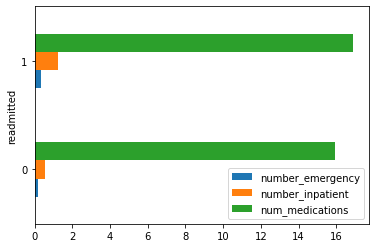

In [51]:
diabetes.groupby(['readmitted']).mean()[['number_emergency', 'number_inpatient','num_medications' ]].plot.barh()


# Converting all categorical to numerical data

In [52]:
diabetes_num = pd.get_dummies(diabetes, drop_first = False)

In [53]:
diabetes_num

,gender,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,...,glyburide-metformin_< 1.25/250 mg,glyburide-metformin_> 1.25/250 mg,glipizide-metformin_0 mg,glipizide-metformin_2.5 mg/250 mg,glimepiride-pioglitazone_0 mg,glimepiride-pioglitazone_90 ?150 mg/dL,metformin-rosiglitazone_0 mg,metformin-rosiglitazone_500 mg/2 mg,metformin-pioglitazone_0 mg,metformin-pioglitazone_No
0,1,6,25,1,1,41,0,1,0,0,...,0,0,1,0,1,0,1,0,1,0
1,1,1,1,7,3,59,0,18,0,0,...,0,0,1,0,1,0,1,0,1,0
2,1,1,1,7,2,11,5,13,2,0,...,0,0,1,0,1,0,1,0,1,0
3,2,1,1,7,2,44,1,16,0,0,...,0,0,1,0,1,0,1,0,1,0
4,2,1,1,7,1,51,0,8,0,0,...,0,0,1,0,1,0,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
101761,2,1,3,7,3,51,0,16,0,0,...,0,0,1,0,1,0,1,0,1,0
101762,1,1,4,5,5,33,3,18,0,0,...,0,0,1,0,1,0,1,0,1,0
101763,2,1,1,7,1,53,0,9,1,0,...,0,0,1,0,1,0,1,0,1,0
101764,1,2,3,7,10,45,2,21,0,0,...,0,0,1,0,1,0,1,0,1,0


In [54]:
diabetes_num.corr()

,gender,admission_type_id,discharge_disposition_id,admission_source_id,time_in_hospital,num_lab_procedures,num_procedures,num_medications,number_outpatient,number_emergency,...,glyburide-metformin_< 1.25/250 mg,glyburide-metformin_> 1.25/250 mg,glipizide-metformin_0 mg,glipizide-metformin_2.5 mg/250 mg,glimepiride-pioglitazone_0 mg,glimepiride-pioglitazone_90 ?150 mg/dL,metformin-rosiglitazone_0 mg,metformin-rosiglitazone_500 mg/2 mg,metformin-pioglitazone_0 mg,metformin-pioglitazone_No
gender,1.000000,0.014636,-0.020991,-0.003810,-0.029866,-0.003021,0.059843,-0.022030,-0.011430,-0.021043,...,-0.001987,0.000669,-0.006956,0.006956,0.002907,-0.002907,-0.004780,0.004780,-0.004780,0.004780
admission_type_id,0.014636,1.000000,0.083483,0.106654,-0.012500,-0.143713,0.129888,0.079535,0.026511,-0.019116,...,-0.002784,0.002153,0.004399,-0.004399,0.002221,-0.002221,0.000074,-0.000074,0.000074,-0.000074
discharge_disposition_id,-0.020991,0.083483,1.000000,0.018193,0.162748,0.023415,0.015921,0.108753,-0.008715,-0.024471,...,-0.002980,-0.004560,-0.000444,0.000444,0.001612,-0.001612,0.000181,-0.000181,0.000181,-0.000181
admission_source_id,-0.003810,0.106654,0.018193,1.000000,-0.006965,0.048885,-0.135400,-0.054533,0.027244,0.059892,...,-0.002055,-0.003282,0.000387,-0.000387,-0.000961,0.000961,0.001914,-0.001914,0.001914,-0.001914
time_in_hospital,-0.029866,-0.012500,0.162748,-0.006965,1.000000,0.318450,0.191472,0.466135,-0.008916,-0.009681,...,0.004555,-0.004518,0.000626,-0.000626,0.002516,-0.002516,0.000588,-0.000588,0.000588,-0.000588
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
glimepiride-pioglitazone_90 ?150 mg/dL,-0.002907,-0.002221,-0.001612,0.000961,-0.002516,-0.000812,-0.002462,-0.003480,-0.000914,-0.000667,...,-0.000024,-0.000028,0.000035,-0.000035,-1.000000,1.000000,0.000014,-0.000014,0.000014,-0.000014
metformin-rosiglitazone_0 mg,-0.004780,0.000074,0.000181,0.001914,0.000588,-0.001218,-0.004315,-0.007897,0.001292,0.000943,...,0.000034,0.000039,-0.000050,0.000050,-0.000014,0.000014,1.000000,-1.000000,1.000000,-1.000000
metformin-rosiglitazone_500 mg/2 mg,0.004780,-0.000074,-0.000181,-0.001914,-0.000588,0.001218,0.004315,0.007897,-0.001292,-0.000943,...,-0.000034,-0.000039,0.000050,-0.000050,0.000014,-0.000014,-1.000000,1.000000,-1.000000,1.000000
metformin-pioglitazone_0 mg,-0.004780,0.000074,0.000181,0.001914,0.000588,-0.001218,-0.004315,-0.007897,0.001292,0.000943,...,0.000034,0.000039,-0.000050,0.000050,-0.000014,0.000014,1.000000,-1.000000,1.000000,-1.000000


##Train and Test Data

In [55]:
train_df, valid_df, test_df = np.split(diabetes_num.sample(frac=1, random_state=42), 
                                       [int(.7*len(diabetes_num)), int(0.85*len(diabetes_num))])
train_df = train_df.reset_index(drop = True)
valid_df = valid_df.reset_index(drop = True)
test_df = test_df.reset_index(drop = True)

In [56]:
diabetes_num.readmitted.value_counts()

0    90409
1    11357
Name: readmitted, dtype: int64

In [57]:
train_df.readmitted.value_counts()

0    63275
1     7961
Name: readmitted, dtype: int64

In [58]:
valid_df.readmitted.value_counts()

0    13520
1     1745
Name: readmitted, dtype: int64

In [59]:
test_df.readmitted.value_counts()

0    13614
1     1651
Name: readmitted, dtype: int64

##Treating the Imbalance of Data

In [60]:
def calc_prevalence(y_actual):
    return (sum(y_actual)/len(y_actual))

In [61]:
rows_pos = train_df.readmitted == 1
df_train_pos = train_df.loc[rows_pos]
df_train_neg = train_df.loc[~rows_pos]

In [62]:
readmitted_df_balanced = pd.concat([df_train_pos, df_train_neg.sample(n = len(df_train_pos), random_state = 111)],axis = 0)

readmitted_df_balanced = readmitted_df_balanced.sample(n = len(readmitted_df_balanced), random_state = 42).reset_index(drop = True)
print('Train balanced prevalence(n = %d):%.3f'%(len(readmitted_df_balanced), \
                                                calc_prevalence(readmitted_df_balanced.readmitted.values)))

Train balanced prevalence(n = 15922):0.500


In [63]:
readmitted_df_balanced.readmitted.value_counts()

1    7961
0    7961
Name: readmitted, dtype: int64

In [64]:
X_train = readmitted_df_balanced.drop('readmitted',axis=1)

y_train = readmitted_df_balanced['readmitted']

X_valid = valid_df.drop('readmitted',axis=1)

y_valid = valid_df['readmitted']

X_test = test_df.drop('readmitted',axis=1)

y_test = test_df['readmitted']

In [65]:
scaler=StandardScaler()
X_train[['diabetesMed', 'time_in_hospital', 'number_inpatient']] = pd.DataFrame(scaler.fit_transform(X_train[['diabetesMed', 'time_in_hospital', 'number_inpatient']]),columns=['diabetesMed', 'time_in_hospital', 'number_inpatient'])
X_valid[['diabetesMed', 'time_in_hospital', 'number_inpatient']] = pd.DataFrame(scaler.transform(X_valid[['diabetesMed', 'time_in_hospital', 'number_inpatient']]),columns=['diabetesMed', 'time_in_hospital', 'number_inpatient'])
X_test[['diabetesMed', 'time_in_hospital', 'number_inpatient']] = pd.DataFrame(scaler.transform(X_test[['diabetesMed', 'time_in_hospital', 'number_inpatient']]),columns=['diabetesMed', 'time_in_hospital', 'number_inpatient'])

##Creating and Understanding the Model

In [66]:
def calc_specificity(y_actual, y_pred, thresh):
    # calculates specificity
    return sum((y_pred < thresh) & (y_actual == 0)) /sum(y_actual == 0)

In [67]:
def print_report(y_actual, y_pred, thresh = 0.5):
  auc = roc_auc_score(y_actual, y_pred)
  accuracy = accuracy_score(y_actual, (y_pred > thresh))
  recall = recall_score(y_actual, (y_pred > thresh))
  precision = precision_score(y_actual, (y_pred > thresh))
  specificity = calc_specificity(y_actual, y_pred, thresh)
  print('AUC:%.3f'%auc)
  print('accuracy:%.3f'%accuracy)
  print('recall:%.3f'%recall)
  print('precision:%.3f'%precision)
  print('specificity:%.3f'%specificity)
  print('prevalence:%.3f'%calc_prevalence(y_actual))
  print(' ')
  return auc, accuracy, recall, precision, specificity

##Linear Regression 

In [68]:
from sklearn.linear_model import LinearRegression

In [69]:
lnr = LinearRegression()
lnr.fit(X_train, y_train)

y_valid_preds = lnr.predict(X_valid)

In [70]:
y_valid_preds

array([0.47636833, 0.71086607, 0.65850767, ..., 0.47090049, 0.66254306,
       0.57364853])

In [71]:
y_valid_preds.max()

1.5890634068902085

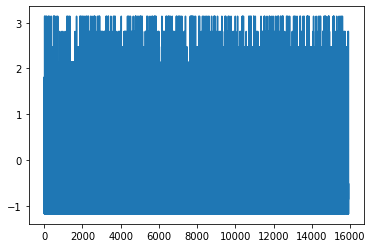

In [72]:
plt.plot(X_train['time_in_hospital'])

Plot DiabetesMed

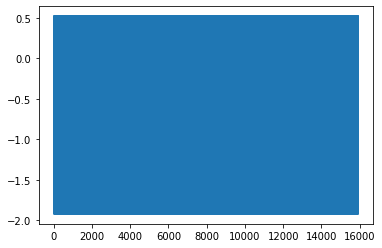

In [73]:
plt.plot(X_train['diabetesMed'])

Plot number inpatient

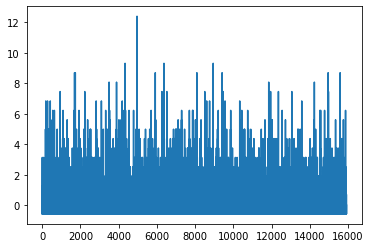

In [74]:
plt.plot(X_train['number_inpatient'])

##Logistic Regression

In [75]:
lr=LogisticRegression(random_state = 42, solver = 'newton-cg', max_iter = 200)
lr.fit(X_train, y_train)

y_valid_preds1 = lr.predict_proba(X_valid)[:,1]

print('Metrics for Validation data:')

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,y_valid_preds, 0.5)
   

Metrics for Validation data:
AUC:0.636
accuracy:0.647
recall:0.528
precision:0.168
specificity:0.662
prevalence:0.114
 


K means 

In [76]:
knn = KNeighborsClassifier(n_neighbors = 100)
knn.fit(X_train, y_train)

knn_preds = knn.predict_proba(X_valid)[:,1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,knn_preds, 0.5)

AUC:0.595
accuracy:0.579
recall:0.550
precision:0.145
specificity:0.540
prevalence:0.114
 


Recall increased only slightly in the KNN model compared to Logistic regression. 

#Stochastic Gradient Descent Model

In [77]:
sgdc=SGDClassifier(loss = 'log',alpha = 0.1,random_state = 42)
sgdc.fit(X_train, y_train)

sgd_preds = sgdc.predict_proba(X_valid)[:,1]

print('Stochastic Gradient Descent')
print('Validation:')
sgdc_valid_auc, sgdc_valid_accuracy, sgdc_valid_recall, \
                sgdc_valid_precision, sgdc_valid_specificity = print_report(y_valid,sgd_preds, 0.5)

Stochastic Gradient Descent
Validation:
AUC:0.636
accuracy:0.662
recall:0.503
precision:0.169
specificity:0.682
prevalence:0.114
 


#Decision Tree

In [78]:
dc_clf = DecisionTreeClassifier(random_state=42, max_depth = 10)
dc_clf.fit(X_train, y_train)

dc_preds_proba = dc_clf.predict_proba(X_valid)[:,1]
dc_preds = dc_clf.predict(X_valid)

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,dc_preds_proba, 0.5)

AUC:0.627
accuracy:0.637
recall:0.546
precision:0.167
specificity:0.626
prevalence:0.114
 


#Random Forest

In [79]:
rf_clf = RandomForestClassifier(random_state=111, max_depth = 6)

rf_clf.fit(X_train, y_train)

rf_preds = rf_clf.predict(X_valid)
rf_preds_proba = rf_clf.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,rf_preds_proba, 0.5)

AUC:0.643
accuracy:0.601
recall:0.586
precision:0.160
specificity:0.603
prevalence:0.114
 


#Linear SVC

In [80]:
lsvc_clf = LinearSVC(random_state=111)
lsvc_clf.fit(X_train, y_train)

lsvc_preds = lsvc_clf.decision_function(X_valid)

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,lsvc_preds, 0.5)

AUC:0.603
accuracy:0.268
recall:0.905
precision:0.125
specificity:0.185
prevalence:0.114
 


#Gradient Boosting Model

In [81]:
gb_clf = GradientBoostingClassifier(n_estimators = 100, criterion='friedman_mse', learning_rate = 1.0, max_depth = 3,\
                                    random_state = 111)

gb_clf.fit(X_train, y_train)
gb_preds = gb_clf.predict(X_valid)
gb_preds_proba = gb_clf.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,gb_preds_proba, 0.5)

AUC:0.630
accuracy:0.611
recall:0.577
precision:0.162
specificity:0.616
prevalence:0.114
 


#XGB Model

In [82]:
xgb_clf = xgb.XGBClassifier(max_depth=3, learning_rate = 1.0, use_label_encoder = False,\
                            eval_metric = 'logloss')
xgb_clf.fit(X_train, y_train)
xgb_preds = xgb_clf.predict(X_valid)
xgb_preds_proba = xgb_clf.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,xgb_preds_proba, 0.5)


ValueError: ignored

Catboost Model

In [83]:
catb=CatBoostClassifier(iterations=200, depth=3, learning_rate=1.0, random_state = 111)
catb.fit(X_train, y_train)
catb_preds = catb.predict_proba(X_valid)[:, 1]

lr_valid_auc, lr_valid_accuracy, lr_valid_recall, \
    lr_valid_precision, lr_valid_specificity = print_report(y_valid,catb_preds, 0.5)

0:	learn: 0.6665816	total: 52.4ms	remaining: 10.4s
1:	learn: 0.6609460	total: 56.7ms	remaining: 5.61s
2:	learn: 0.6581290	total: 60.4ms	remaining: 3.97s
3:	learn: 0.6552349	total: 66.9ms	remaining: 3.28s
4:	learn: 0.6530633	total: 71.4ms	remaining: 2.79s
5:	learn: 0.6509231	total: 75.9ms	remaining: 2.46s
6:	learn: 0.6496252	total: 80.8ms	remaining: 2.23s
7:	learn: 0.6492026	total: 85.2ms	remaining: 2.04s
8:	learn: 0.6487815	total: 89.8ms	remaining: 1.9s
9:	learn: 0.6480428	total: 94.3ms	remaining: 1.79s
10:	learn: 0.6472697	total: 98.6ms	remaining: 1.69s
11:	learn: 0.6463817	total: 103ms	remaining: 1.61s
12:	learn: 0.6449807	total: 108ms	remaining: 1.55s
13:	learn: 0.6441333	total: 112ms	remaining: 1.49s
14:	learn: 0.6428938	total: 117ms	remaining: 1.44s
15:	learn: 0.6392991	total: 122ms	remaining: 1.4s
16:	learn: 0.6385809	total: 127ms	remaining: 1.36s
17:	learn: 0.6381167	total: 131ms	remaining: 1.33s
18:	learn: 0.6373200	total: 136ms	remaining: 1.29s
19:	learn: 0.6366299	total: 140m

Decision Tree - Hyper Parameter Tuning

In [84]:
recall_scoring = make_scorer(recall_score)

In [85]:
dc_grid = {'max_features':['auto','sqrt'], # maximum number of features to use at each split
           'max_depth':range(1,11,1), # maximum depth of the tree
           'min_samples_split':range(2,10,2), # minimum number of samples to split a node
           'criterion':['gini','entropy']} # criterion for evaluating a split

dc_random = RandomizedSearchCV(estimator = dc_clf, param_distributions = dc_grid, 
                               n_iter = 20, cv = 2, scoring=recall_scoring,
                               verbose = 1, random_state = 111)

dc_random.fit(X_train, y_train)

dc_random.best_params_

dc_hp_preds = dc_random.best_estimator_.predict(X_valid)
dc_hp_preds_proba = dc_random.best_estimator_.predict_proba(X_valid)[:,1]
roc_auc_score(y_valid, dc_hp_preds_proba)

Fitting 2 folds for each of 20 candidates, totalling 40 fits


0.5125891176819654

In [86]:
recall_score(y_valid, dc_hp_preds)

0.8240687679083094

Random Forest - Hyper Parameter Tuning

In [87]:
rf_grid = {'n_estimators':range(200,1000,200), # number of trees
           'max_features':['auto','sqrt'], # maximum number of features to use at each split
           'max_depth':range(1,11,1), # maximum depth of the tree
           'min_samples_split':range(2,10,2), # minimum number of samples to split a node
           'criterion':['gini','entropy']} # criterion for evaluating a split

rf_random = RandomizedSearchCV(estimator = rf_clf, param_distributions = rf_grid, 
                               n_iter = 20, cv = 2, scoring=recall_scoring,
                               verbose = 1, random_state = 111)

rf_random.fit(X_train, y_train)

rf_random.best_params_

rf_hp_preds = rf_random.best_estimator_.predict(X_valid)
rf_hp_preds_proba = rf_random.best_estimator_.predict_proba(X_valid)[:,1]
roc_auc_score(y_valid, rf_hp_preds_proba)

Fitting 2 folds for each of 20 candidates, totalling 40 fits


0.645782201047795

In [88]:
recall_score(y_valid, rf_hp_preds)

0.5856733524355301

XGBoost - Hyper Parameter Tuning

In [89]:
xgb_grid = params = {
        'min_child_weight': [1, 5, 8, 10],
        'gamma': [0.5, 1, 1.5, 2, 5],
        'subsample': [0.6, 0.8, 1.0],
        'colsample_bytree': [0.6, 0.8, 0.9, 1.0],
        'max_depth': [3, 4, 5]
        } # criterion for evaluating a split

xgb_random = GridSearchCV(estimator = xgb_clf, param_grid = xgb_grid, 
                               cv = 2, scoring = recall_scoring,
                               verbose = 1)

xgb_random.fit(X_train, y_train)

xgb_random.best_params_

xgb_hp_preds = xgb_random.best_estimator_.predict(X_valid)
xgb_hp_preds_proba = xgb_random.best_estimator_.predict_proba(X_valid)[:,1]
roc_auc_score(y_valid, xgb_hp_preds_proba)

Fitting 2 folds for each of 720 candidates, totalling 1440 fits


NotFittedError: ignored

In [ ]:
recall_score(y_valid, xgb_hp_preds)